In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import datetime as dt

import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

from ray import tune
from ray.air import session
from ray.train import Checkpoint

from recsys4daos.utils.notebooks import download_plotly, download_matplotlib
import paths

pio.templates.default = 'seaborn'
sns.set_theme()

In [2]:
SPLITS_FREQ = 'W-THU'
SPLITS_NORMALIZE = True # Wether or not to move everything to 00:00
CUTOFF_DATE = dt.datetime.fromisoformat("2023-07-29")
RAY_RESULTS_PATH = '~/ray_results3.11'
ORG_NAME = 'Decentraland'
LAST_FOLDS = 10 # Used for asserts
LAST_FOLD_DATE_STR: str = '2023-07-13'

OPTIM_METRIC = 'map@10'
OPTIM_MODE = 'max'

SAMPLES_PER_SPLIT: int = 100 # See 07_microsoft_tuning.ipynb

In [3]:
# Parameters
EXECUTION_ID = "2024-09-04T10:00"
MAX_BATCH_SIZE = 9
ORG_NAME = "PancakeSwap"
SPLITS_FREQ = "3d"
LAST_FOLDS = 10
SPLITS_NORMALIZE = True
LAST_FOLD_DATE_STR = "2023-06-27"


In [4]:
RAY_RESULTS_PATH = Path(RAY_RESULTS_PATH).expanduser()
assert RAY_RESULTS_PATH.is_dir()

## Get ray results

In [5]:
fname_glob = paths.lightgcn_ray_tune_fname(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, OPTIM_METRIC, fold='glob')
fname_glob

'PancakeSwap/LightGCN_3d_normalize_map@10_fold=[0-9]*'

In [6]:
last_experiments = sorted(RAY_RESULTS_PATH.glob(fname_glob))
print(f"Found {len(last_experiments)} folds")

class TrainLightGCN:
    def __init__(self):
        raise NotImplementedError

tuners = [ tune.Tuner.restore(str(l), TrainLightGCN) for l in last_experiments ]
result_grids = [ tuner.get_results() for tuner in tuners ]
assert len(result_grids) == LAST_FOLDS, f"Waiting for full experiment to run {len(result_grids)}/{LAST_FOLDS}"

for i, rg in enumerate(result_grids):
    print(f"Fold: {i}, {rg.num_terminated} finished, {rg.num_errors} errors")
    assert rg.num_terminated == SAMPLES_PER_SPLIT
    assert rg.num_errors == 0, "There should be no errors"

Found 10 folds


Fold: 0, 100 finished, 0 errors
Fold: 1, 100 finished, 0 errors
Fold: 2, 100 finished, 0 errors
Fold: 3, 100 finished, 0 errors
Fold: 4, 100 finished, 0 errors
Fold: 5, 100 finished, 0 errors
Fold: 6, 100 finished, 0 errors
Fold: 7, 100 finished, 0 errors
Fold: 8, 100 finished, 0 errors
Fold: 9, 100 finished, 0 errors


In [7]:
# Checking data from just one experiment
pd.concat(result_grids[0]._experiment_analysis.trial_dataframes.values())

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,node_ip,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,256,5,0.073733,0.073727,6.071576e-06,0.000000,0.000,0.000,0.000,0.202,...,147.96.81.131,258.638369,1,8,16,2,0.0003,1.121763e-06,10YE,2023-05-31T00:00:00
1,256,10,0.046314,0.046306,8.169106e-06,0.000000,0.000,0.000,0.000,0.200,...,147.96.81.131,446.179464,2,8,16,2,0.0003,1.121763e-06,10YE,2023-05-31T00:00:00
0,512,5,0.328942,0.328942,2.632878e-07,0.024080,0.026,0.026,0.026,0.196,...,147.96.81.131,26.690519,1,9,124,1,0.0002,1.511965e-07,90d,2023-05-31T00:00:00
1,512,10,0.181420,0.181420,5.694491e-07,0.024000,0.024,0.024,0.024,0.194,...,147.96.81.131,52.916890,2,9,124,1,0.0002,1.511965e-07,90d,2023-05-31T00:00:00
2,512,15,0.133769,0.133768,8.224535e-07,0.026000,0.026,0.026,0.026,0.198,...,147.96.81.131,78.425768,3,9,124,1,0.0002,1.511965e-07,90d,2023-05-31T00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,128,10,0.115322,0.115320,1.850535e-06,0.012000,0.012,0.012,0.012,0.204,...,147.96.81.131,118.155998,2,7,5,3,0.0018,3.801643e-07,90d,2023-05-31T00:00:00
2,128,15,0.081328,0.081325,2.728951e-06,0.016135,0.020,0.020,0.020,0.200,...,147.96.81.131,172.804999,3,7,5,3,0.0018,3.801643e-07,90d,2023-05-31T00:00:00
3,128,20,0.065747,0.065743,3.524083e-06,0.035087,0.040,0.040,0.040,0.186,...,147.96.81.131,227.823511,4,7,5,3,0.0018,3.801643e-07,90d,2023-05-31T00:00:00
4,128,25,0.056735,0.056731,4.054761e-06,0.037000,0.040,0.040,0.040,0.198,...,147.96.81.131,282.850991,5,7,5,3,0.0018,3.801643e-07,90d,2023-05-31T00:00:00


## Create dataframe with all results

In [8]:
# Read dataframe and drop some unneeded columns
# rdf = pd.concat([rg.get_dataframe(TARGET, 'max') for rg in result_grids ])
rdf = pd.concat([ pd.concat(rg._experiment_analysis.trial_dataframes.values()) for rg in result_grids ])

drop_cols = [
    'timestamp', 'node_ip', 'pid', 'hostname', 'time_since_restore', # 'checkpoint_dir_name', 'trial_id', # 'logdir'
    'model_recall', 'model_ndcg', 'model_precision', 'model_map', 
    'time_train', 'time_eval', 'time_total_s', 'time_this_iter_s',
    'training_iteration', 'iterations_since_restore',
    # 'recall@5', 'map@5', 'recall@10', 'map@10',
]
rdf = rdf.drop(columns=drop_cols)
rdf = rdf.drop(columns=['date']).rename(columns={'config/__trial_index__': 'config/fold', 'iteration':'config/iteration'})
rdf['config/fold'] = pd.to_datetime(rdf['config/fold'])
# rdf = rdf[rdf['done']]
print(rdf.columns)

for c in ['config/batch_size']: #, 'config/embedding_dim']:
    rdf[c] = 2**rdf[c]

# rdf[(rdf['config/fold'] >= 1) & (rdf['iteration'] > 10)].sort_values('precision@5').tail()
# Display some results
rdf.sort_values(OPTIM_METRIC).tail()

Index(['real_batch_size', 'config/iteration', 'loss', 'mf_loss', 'emb_loss',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_rec', 'time_total_train', 'time_total_test', 'done', 'trial_id',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_size',
       'config/fold'],
      dtype='object')


,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
3,128,20,0.157143,0.154096,0.003047,0.329787,0.234929,0.169149,0.100798,0.074645,...,2.373026,True,dcd6dffa,128,1,2,0.0449,0.000343,90d,2023-06-24
1,128,10,0.234413,0.234365,0.000049,0.335106,0.237589,0.155319,0.098936,0.075887,...,1.073134,False,9fef41c6,128,15,1,0.0002,0.000013,90d,2023-06-24
3,128,20,0.189005,0.188952,0.000053,0.388298,0.248227,0.160106,0.093351,0.068617,...,2.203630,False,aa6fefff,128,1,1,0.0130,0.000013,90d,2023-06-24
1,512,10,0.154506,0.153352,0.001153,0.327128,0.258865,0.169149,0.096543,0.068440,...,1.029507,False,53e9c49a,512,1,2,0.0262,0.000041,10YE,2023-06-24
3,512,20,0.151263,0.148970,0.002294,0.401596,0.264184,0.167553,0.097872,0.075532,...,2.133174,True,53e9c49a,512,1,2,0.0262,0.000041,10YE,2023-06-24


### Define K_RECOMMENDATIONS

In [9]:
K_RECOMMENDATIONS = { int(c.split('@')[1]) for c in rdf.columns if '@' in c }
K_RECOMMENDATIONS

{1, 3, 5, 10, 15, 100}

## Assert that every experiment was completed

In [10]:
_config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

# _s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
# print(_s)

# Cuidado, no es aleatorio sin reemplazamiento, por lo que
# alguna config, por casualidad, puede estar repetida y es necesario
# usar trial_id
_config_cols.append('trial_id')

_s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
print(_s)
assert all(_s == SAMPLES_PER_SPLIT), "Insufficient number of samples" 

config/fold
2023-05-31    100
2023-06-03    100
2023-06-06    100
2023-06-09    100
2023-06-12    100
2023-06-15    100
2023-06-18    100
2023-06-21    100
2023-06-24    100
2023-06-27    100
dtype: int64


## Get total execution time

In [11]:
_config_cols = ['trial_id'] + [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

last_iteration_time = rdf.groupby(_config_cols)['time_total_train'].max()
print(last_iteration_time)
print("Mean exec time: ", dt.timedelta(seconds=last_iteration_time.mean()))
print("Total exec time:", dt.timedelta(seconds=last_iteration_time.sum()))

trial_id  config/batch_size  config/embedding_dim  config/conv_layers  config/learning_rate  config/l2     config/window_size  config/fold
0010fb37  512                2                     1                   0.0001                1.080905e-05  90d                 2023-06-15      316.341713
00244d76  256                104                   4                   0.0001                2.803397e-07  30d                 2023-06-15      199.338674
00469c90  64                 56                    1                   0.0629                1.699980e-05  10YE                2023-06-27      574.030899
007bbe85  512                54                    1                   0.0002                5.607467e-06  90d                 2023-06-18      302.399281
00a790f1  256                18                    1                   0.0006                5.923909e-06  21d                 2023-06-27       33.823344
                                                                                           

In [12]:
# Number of iterations
rdf.groupby('trial_id')['config/iteration'].max().describe()

count    1000.000000
mean       95.295000
std        73.629201
min         5.000000
25%        25.000000
50%        75.000000
75%       185.000000
max       200.000000
Name: config/iteration, dtype: float64

## Get baseline data

In [13]:
bdf = paths.load_openpop(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
bdf = bdf[bdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
bdf.mean()

precision@1        0.179785
precision@3        0.201951
precision@5        0.180403
precision@10       0.113265
precision@15       0.079463
precision@100      0.018404
ndcg@1             0.179785
ndcg@3             0.311642
ndcg@5             0.371895
ndcg@10            0.410944
ndcg@15            0.418724
ndcg@100           0.484181
map@1              0.179785
map@3              0.268687
map@5              0.311852
map@10             0.341082
map@15             0.343387
map@100            0.357268
recall@1           0.115680
recall@3           0.363058
recall@5           0.491389
recall@10          0.583938
recall@15          0.608540
recall@100         0.877773
r-precision@1      0.521042
r-precision@3      0.505945
r-precision@5      0.525960
r-precision@10     0.523234
r-precision@15     0.521847
r-precision@100    0.524394
time_eval          0.211864
dtype: float64

In [14]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-06-21,0.021368,0.017094,0.017094,0.016239,0.019943,0.022521,0.021368,0.022054,0.025549,0.033361,...,0.048056,0.098297,0.77773,0.323710,0.334830,0.326748,0.308570,0.287767,0.301492,0.402365
2023-06-24,0.361702,0.250000,0.164362,0.086436,0.060461,0.022154,0.361702,0.399934,0.413213,0.415783,...,0.462912,0.473889,1.00000,0.662850,0.912039,0.871463,0.858709,0.859927,0.861670,0.473896
2023-06-27,0.032895,0.070175,0.047368,0.038816,0.035088,0.023553,0.032895,0.092320,0.089688,0.110307,...,0.179195,0.207174,1.00000,0.312381,0.323829,0.331687,0.344544,0.350258,0.360258,0.233954
2023-06-30,0.015748,0.055118,0.037795,0.025984,0.035696,0.019291,0.015748,0.080535,0.086076,0.095149,...,0.149213,0.306037,1.00000,0.666667,0.401852,0.378333,0.359091,0.359091,0.359091,0.205227
2023-07-03,0.083333,0.232639,0.256250,0.216667,0.144444,0.021667,0.083333,0.284229,0.395736,0.564876,...,1.000000,1.000000,1.00000,0.361607,0.360635,0.413280,0.423333,0.423333,0.423333,0.145320
2023-07-06,0.513793,0.402299,0.271034,0.172759,0.115172,0.017276,0.513793,0.677469,0.711316,0.776266,...,1.000000,1.000000,1.00000,0.589933,0.968074,0.899708,0.899708,0.899708,0.899708,0.188610
2023-07-09,0.065574,0.273224,0.367213,0.219672,0.146448,0.021967,0.065574,0.343450,0.555130,0.617423,...,1.000000,1.000000,1.00000,0.562500,0.380808,0.521717,0.521717,0.521717,0.521717,0.137553
2023-07-12,0.019231,0.262821,0.369231,0.219231,0.146154,0.021923,0.019231,0.332979,0.558792,0.612818,...,1.000000,1.000000,1.00000,1.000000,0.377381,0.516667,0.516667,0.516667,0.516667,0.134720
2023-07-15,0.684211,0.456140,0.273684,0.136842,0.091228,0.013684,0.684211,0.883452,0.883452,0.883452,...,1.000000,1.000000,1.00000,0.730769,1.000000,1.000000,1.000000,1.000000,1.000000,0.126128


(0.0, 1.0)

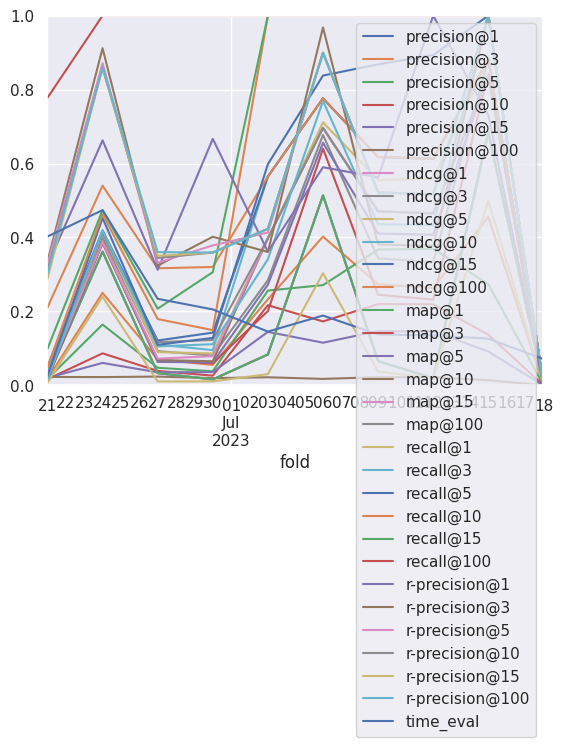

In [15]:
ax = bdf.plot()
ax.set_ylim(0, 1)

### Get perfect data

In [16]:
pdf = paths.load_perfect(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
pdf = pdf[pdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
pdf.mean()

precision@1        0.900000
precision@3        0.525700
precision@5        0.354262
precision@10       0.185367
precision@15       0.124896
precision@100      0.019062
ndcg@1             0.900000
ndcg@3             0.900000
ndcg@5             0.900000
ndcg@10            0.900000
ndcg@15            0.900000
ndcg@100           0.900000
map@1              0.900000
map@3              0.900000
map@5              0.900000
map@10             0.900000
map@15             0.900000
map@100            0.900000
recall@1           0.620702
recall@3           0.849596
recall@5           0.889031
recall@10          0.897905
recall@15          0.898914
recall@100         0.900000
r-precision@1      0.620702
r-precision@3      0.849596
r-precision@5      0.889031
r-precision@10     0.897905
r-precision@15     0.898914
r-precision@100    0.900000
time_eval          0.148321
dtype: float64

In [17]:
pdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-06-21,1.0,0.621083,0.452991,0.266667,0.185755,0.029103,1.0,1.0,1.0,1.0,...,0.988482,0.995344,1.0,0.648285,0.885026,0.947266,0.988482,0.995344,1.0,0.180553
2023-06-24,1.0,0.586879,0.386702,0.209840,0.142908,0.022154,1.0,1.0,1.0,1.0,...,0.995267,0.997554,1.0,0.700807,0.950825,0.978547,0.995267,0.997554,1.0,0.196270
2023-06-27,1.0,0.592105,0.400000,0.219079,0.148246,0.023553,1.0,1.0,1.0,1.0,...,0.995301,0.996241,1.0,0.687769,0.938307,0.975029,0.995301,0.996241,1.0,0.157949
2023-06-30,1.0,0.590551,0.379528,0.192913,0.128609,0.019291,1.0,1.0,1.0,1.0,...,1.000000,1.000000,1.0,0.701050,0.969291,0.994751,1.000000,1.000000,1.0,0.149572
2023-07-03,1.0,0.607639,0.427083,0.216667,0.144444,0.021667,1.0,1.0,1.0,1.0,...,1.000000,1.000000,1.0,0.667460,0.924256,0.995288,1.000000,1.000000,1.0,0.146014
2023-07-06,1.0,0.545977,0.344828,0.172759,0.115172,0.017276,1.0,1.0,1.0,1.0,...,1.000000,1.000000,1.0,0.702931,0.979483,0.999425,1.000000,1.000000,1.0,0.174285
2023-07-09,1.0,0.628415,0.439344,0.219672,0.146448,0.021967,1.0,1.0,1.0,1.0,...,1.000000,1.000000,1.0,0.641257,0.923770,1.000000,1.000000,1.000000,1.0,0.140059
2023-07-12,1.0,0.628205,0.438462,0.219231,0.146154,0.021923,1.0,1.0,1.0,1.0,...,1.000000,1.000000,1.0,0.641667,0.925000,1.000000,1.000000,1.000000,1.0,0.136209
2023-07-15,1.0,0.456140,0.273684,0.136842,0.091228,0.013684,1.0,1.0,1.0,1.0,...,1.000000,1.000000,1.0,0.815789,1.000000,1.000000,1.000000,1.000000,1.0,0.128604


(0.0, 1.0)

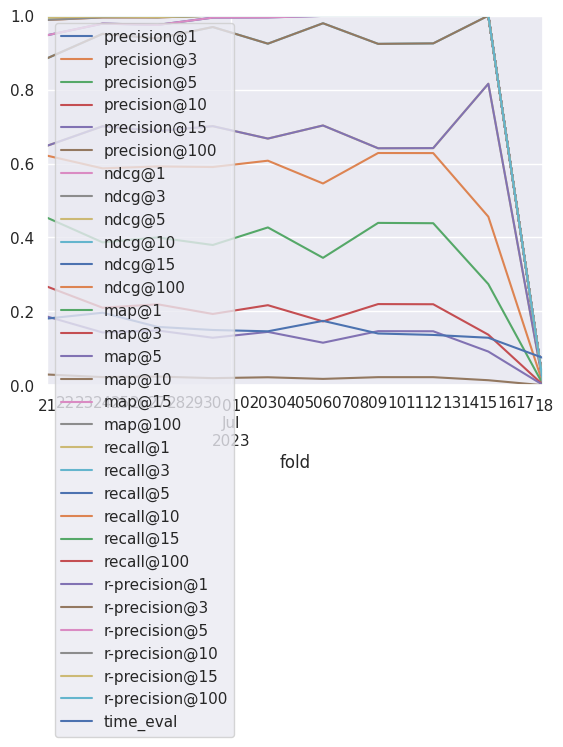

In [18]:
ax = pdf.plot()
ax.set_ylim(0, 1)

## Explore hparams

In [19]:
# Primero, obtenemos la mejor iteración, como si hubiesemos hecho early stopping
hdf = pd.concat(rg.get_dataframe(OPTIM_METRIC, OPTIM_MODE) for rg in result_grids)
print(hdf.columns)
hdf

Index(['real_batch_size', 'iteration', 'loss', 'mf_loss', 'emb_loss',
       'model_recall', 'model_ndcg', 'model_precision', 'model_map',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_eval', 'time_train', 'time_rec', 'time_total_train',
       'time_total_test', 'done', 'training_iteration', 'trial_id', 'date',
       'timestamp', 'time_this_iter_s', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'iterations_since_restore',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_siz

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,logdir
0,256,5,0.073733,0.073727,0.000006,0.000000,0.000000,0.000000,0.000000,0.202000,...,258.638369,1,8,16,2,0.0003,1.121763e-06,10YE,2023-05-31T00:00:00,61151935
1,512,20,0.105262,0.105261,0.000001,0.024222,0.026000,0.026000,0.026000,0.200000,...,101.931654,4,9,124,1,0.0002,1.511965e-07,90d,2023-05-31T00:00:00,1e33b912
2,256,10,0.062141,0.061852,0.000289,0.000000,0.000000,0.000000,0.000000,0.206000,...,433.687211,2,8,47,2,0.0001,3.750368e-05,10YE,2023-05-31T00:00:00,bac0b96c
3,512,5,0.362943,0.362360,0.000582,0.123667,0.130000,0.130000,0.130000,0.154000,...,5.515787,1,9,46,3,0.0010,4.621719e-04,30d,2023-05-31T00:00:00,7f6aaf1d
4,64,15,0.253887,0.253880,0.000006,0.068280,0.072000,0.072000,0.072000,0.152000,...,119.237320,3,6,156,1,0.0001,1.057185e-06,30d,2023-05-31T00:00:00,da8c659b
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,256,5,0.141436,0.138841,0.002595,0.000000,0.000000,0.000000,0.000000,0.111842,...,131.367507,1,8,4,3,0.0003,6.731523e-04,10YE,2023-06-27T00:00:00,575515a4
96,128,40,0.011867,0.004306,0.007561,0.010056,0.019737,0.019737,0.019737,0.065789,...,153.900688,8,7,34,2,0.0091,7.608004e-04,60d,2023-06-27T00:00:00,d6e57c16
97,256,180,0.161658,0.161653,0.000006,0.000000,0.000000,0.000000,0.000000,0.203947,...,90.704066,36,8,1,1,0.0299,2.232327e-07,30d,2023-06-27T00:00:00,23ee01c2
98,128,10,0.034691,0.034126,0.000565,0.000000,0.000000,0.000000,0.000000,0.105263,...,530.135771,2,7,9,1,0.0005,6.898281e-05,10YE,2023-06-27T00:00:00,c2b0a47d


In [20]:
# Force categorization
hdf['config/fold'] = hdf['config/fold'].astype(str)

fig = px.scatter(hdf, x='map@10', y='ndcg@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [21]:
fig = px.scatter(hdf, x='iteration', y='loss', color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [22]:
fig = px.scatter(hdf, x='iteration', y=OPTIM_METRIC, color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [23]:
fig = px.scatter(hdf, x='loss', y='ndcg@10', color='config/fold', log_x=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [24]:
fig = px.scatter(hdf, x='real_batch_size', y='config/window_size', color='config/fold')
fig

In [25]:
fig = px.scatter(hdf, x=OPTIM_METRIC, y='precision@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_map_precision.pdf')
fig

In [26]:
def plotly_scatter_config(config, log=True):
    config_cols = [c for c in hdf.columns if c.startswith('config/') ]
    return px.scatter(hdf, x=config, y=OPTIM_METRIC, color='config/fold', marginal_x='rug', marginal_y='rug', log_x=log, hover_data=config_cols)

plotly_scatter_config('config/embedding_dim')

In [27]:
plotly_scatter_config('config/window_size', log=False)

In [28]:
plotly_scatter_config('config/learning_rate')

In [29]:
plotly_scatter_config('config/l2')

In [30]:
plotly_scatter_config('config/batch_size', log=False)

In [31]:
plotly_scatter_config('config/conv_layers')

In [32]:
def clean_results(df: pd.DataFrame):
    hparams = [ c.removeprefix('config/') for c in df.columns if c.startswith('config/') and c not in ['config/iteration', 'config/fold'] ]
    return (
        df
        .rename(columns=lambda c: c.removeprefix('config/'),)
        .rename(columns={
            'time_total_train': 'time_train',
            'time_total_test': 'time_eval',
            'time_total_rec': 'time_rec',
        })
        .drop(columns=['real_batch_size'])
        .set_index(['fold', *hparams])
    ), hparams

clean_rdf, hparams = clean_results(rdf.copy())
clean_rdf

iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2023-05-31 256        16            2           0.0003        1.121763e-06 10YE                 5   
                                                                           10YE                10   
           512        124           1           0.0002        1.511965e-07 90d                  5   
                                                                           90d                 10   
                                                                           90d                 15   
...                                                                                           ...   
2023-06-27 128        219           4           0.0950        2.612311e-04 60d                 60   
                                                                           60d                 65   
                                                                           60d                 70   
                                                                           60d                 75   
                                                                           60d                 80   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2023-05-31 256        16            2           0.0003        1.121763e-06 10YE         0.073733   
                                                                           10YE         0.046314   
           512        124           1           0.0002        1.511965e-07 90d          0.328942   
                                                                           90d          0.181420   
                                                                           90d          0.133769   
...                                                                                          ...   
2023-06-27 128        219           4           0.0950        2.612311e-04 60d          0.684029   
                                                                           60d          0.763635   
                                                                           60d          0.693498   
                                                                           60d          0.862433   
                                                                           60d          0.713197   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2023-05-31 256        16            2           0.0003        1.121763e-06 10YE         0.073727   
                                                                           10YE         0.046306   
           512        124           1           0.0002        1.511965e-07 90d          0.328942   
                                                                           90d          0.181420   
                                                                           90d          0.133768   
...                                                                                          ...   
2023-06-27 128        219           4           0.0950        2.612311e-04 60d          0.207494   
                                                                           60d          0.264681   
                                                                           60d          0.223101   
                                                                           60d          0.372780   
                                                                           60d          0.237922   

                                                                                            emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2    

In [33]:
px.scatter(clean_rdf.reset_index(), y='iteration', x='loss', color='fold', log_x=True)

In [34]:
px.scatter(clean_rdf.reset_index(), x='loss', y=OPTIM_METRIC, color='fold', log_x=True)

Letting it run more iterations gets a best loss. But letting it run more does not get a best ndcg or map, as loss and the test results have not a strong correlation.

In [35]:
px.scatter(clean_rdf.reset_index(), y='iteration', x=OPTIM_METRIC, color='fold')

## Choosing best hparams

In [36]:
best_all = clean_rdf.sort_values(OPTIM_METRIC).drop_duplicates('trial_id', keep='last')
paths.save_model_results(best_all, 'lightgcn-all', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best_all

Saved dataframe into /home/daviddavo/recsys4daos/data/output/PancakeSwap/models/lightgcn-all_3d_normalize.parquet


iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2023-06-06 64         74            2           0.1736        8.637994e-07 10YE                 5   
           512        19            1           0.0139        6.082447e-06 10YE                 5   
2023-06-09 128        844           2           0.0578        3.236109e-03 10YE                 5   
2023-06-03 128        13            2           0.0122        2.572501e-05 10YE                 5   
2023-06-06 512        244           4           0.0077        1.194408e-06 10YE                 5   
...                                                                                           ...   
2023-06-24 64         1             2           0.0001        1.214042e-03 90d                 10   
           128        1             2           0.0449        3.426125e-04 90d                 20   
                      15            1           0.0002        1.336404e-05 90d                 10   
                      1             1           0.0130        1.314594e-05 90d                 20   
           512        1             2           0.0262        4.089005e-05 10YE                20   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2023-06-06 64         74            2           0.1736        8.637994e-07 10YE         8.387637   
           512        19            1           0.0139        6.082447e-06 10YE         0.019031   
2023-06-09 128        844           2           0.0578        3.236109e-03 10YE         5.568807   
2023-06-03 128        13            2           0.0122        2.572501e-05 10YE         0.018731   
2023-06-06 512        244           4           0.0077        1.194408e-06 10YE         0.007017   
...                                                                                          ...   
2023-06-24 64         1             2           0.0001        1.214042e-03 90d          0.523899   
           128        1             2           0.0449        3.426125e-04 90d          0.157143   
                      15            1           0.0002        1.336404e-05 90d          0.234413   
                      1             1           0.0130        1.314594e-05 90d          0.189005   
           512        1             2           0.0262        4.089005e-05 10YE         0.151263   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2023-06-06 64         74            2           0.1736        8.637994e-07 10YE         8.350649   
           512        19            1           0.0139        6.082447e-06 10YE         0.018894   
2023-06-09 128        844           2           0.0578        3.236109e-03 10YE         1.086461   
2023-06-03 128        13            2           0.0122        2.572501e-05 10YE         0.018145   
2023-06-06 512        244           4           0.0077        1.194408e-06 10YE         0.006935   
...                                                                                          ...   
2023-06-24 64         1             2           0.0001        1.214042e-03 90d          0.523364   
           128        1             2           0.0449        3.426125e-04 90d          0.154096   
                      15            1           0.0002        1.336404e-05 90d          0.234365   
                      1             1           0.0130        1.314594e-05 90d          0.188952   
           512        1             2           0.0262        4.089005e-05 10YE         0.148970   

                                                                                        emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2        

### Per fold

In [37]:
# We fix the total time in less than 250 so it has time to do the same number of iterations with the next fold
# best = rdf[rdf['time_total_train'] + rdf['time_total_test'] < 250].sort_values(OPTIM_METRIC).drop_duplicates('config/fold', keep='last').set_index('config/fold').sort_index()
idx = clean_rdf.index.names + ['iteration']
best = clean_rdf.sort_values(OPTIM_METRIC).reset_index().drop_duplicates('fold', keep='last').set_index(idx).sort_index()
paths.save_model_results(best, 'lightgcn-best-val', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best

Saved dataframe into /home/daviddavo/recsys4daos/data/output/PancakeSwap/models/lightgcn-best-val_3d_normalize.parquet


,,,,,,,,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_train,time_eval,done,trial_id
fold,batch_size,embedding_dim,conv_layers,learning_rate,l2,window_size,iteration,,,,,,,,,,,,,,,,,,,,,
2023-05-31,256,11,1,0.0030,9.737076e-03,90d,5,0.124001,0.108800,0.015201,0.216000,0.114000,0.080000,0.053200,0.043467,0.027800,0.216000,...,0.790452,0.743127,0.718004,0.712035,0.714947,0.145647,55.757041,0.830290,False,f5e4706d
2023-06-03,64,1,1,0.1464,1.582748e-07,21d,5,0.671872,0.671871,0.000001,0.119266,0.064220,0.051376,0.042202,0.043017,0.026820,0.119266,...,0.566902,0.545140,0.579157,0.571024,0.577880,0.126655,21.430032,0.472589,False,23e2deae
2023-06-06,256,4,4,0.0077,2.533510e-03,21d,55,0.065366,0.052165,0.013201,0.020761,0.069204,0.052595,0.040484,0.043829,0.023599,0.020761,...,0.173403,0.202522,0.257004,0.315232,0.330400,0.023118,44.324339,5.382092,False,14acae12
2023-06-09,128,27,2,0.2056,3.060065e-05,30d,55,0.521879,0.420893,0.100986,0.166667,0.071605,0.054074,0.042963,0.038765,0.020370,0.166667,...,0.820790,0.808802,0.808829,0.819273,0.825787,0.057586,163.676889,5.548068,False,806e26c6
2023-06-12,512,3,4,0.0012,4.564767e-05,30d,60,0.168523,0.168357,0.000166,0.028689,0.101093,0.073770,0.051639,0.046175,0.019672,0.028689,...,0.358508,0.343784,0.358250,0.372504,0.377289,0.008067,10.952359,5.072825,False,a56f4bbd
2023-06-15,512,129,2,0.0005,3.238453e-06,90d,40,0.022949,0.022895,0.000054,0.287425,0.121756,0.079641,0.048204,0.038922,0.020210,0.287425,...,0.905478,0.893559,0.892082,0.887858,0.903232,0.018481,117.625897,6.141340,False,394ddf27
2023-06-18,256,2,2,0.0013,2.620126e-06,90d,5,0.217695,0.217691,0.000005,0.085714,0.052381,0.042857,0.030952,0.033333,0.023524,0.085714,...,0.527372,0.536021,0.551579,0.551579,0.569027,0.077885,15.046264,0.482470,False,b1947d1d
2023-06-21,512,1,2,0.0262,4.089005e-05,10YE,5,0.153124,0.152638,0.000486,0.196581,0.079772,0.053846,0.043590,0.041595,0.020385,0.196581,...,0.518040,0.487448,0.485707,0.480929,0.488012,0.532634,99.349076,0.500311,False,f141dae1
2023-06-24,512,1,2,0.0262,4.089005e-05,10YE,20,0.151263,0.148970,0.002294,0.401596,0.264184,0.167553,0.097872,0.075532,0.022154,0.401596,...,0.821755,0.801201,0.804211,0.805533,0.808411,0.482701,367.827140,2.133174,True,53e9c49a


,precision@5,map@10
count,10.000000,10.000000
mean,0.076229,0.180615
std,0.037379,0.101435
min,0.042857,0.083656
25%,0.052908,0.109551
50%,0.063922,0.150233
75%,0.079910,0.217284
max,0.167553,0.397329


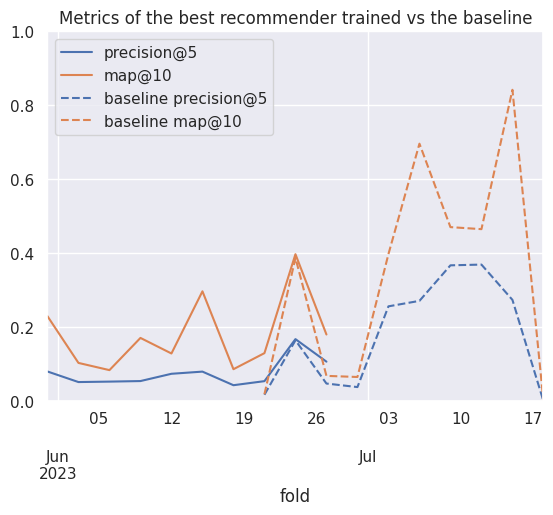

In [38]:
cols2plot = ['precision@5', 'map@10']

ax = best.reset_index().set_index('fold')[cols2plot].plot()
ax.set_ylim(0, 1)

bdf[cols2plot].rename(columns='baseline {}'.format).plot(ax=ax, style='--', color=[l.get_color() for l in ax.lines])

plt.title("Metrics of the best recommender trained vs the baseline")
best[cols2plot].describe()

In [39]:
best[['precision@5', 'ndcg@5', 'precision@10', 'ndcg@10', 'map@5', 'map@10']].mean()

precision@5     0.076229
ndcg@5          0.201070
precision@10    0.053203
ndcg@10         0.218645
map@5           0.174998
map@10          0.180615
dtype: float64

## Realisitc model (repeating hparams)

In [40]:
from pandas.api.types import is_float_dtype

config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]
config_cols2 = config_cols + ['config/iteration']

all_configs = rdf.copy()
display(all_configs)
all_configs['config/fold'] = (pd.to_datetime(all_configs['config/fold']) + pd.tseries.frequencies.to_offset(SPLITS_FREQ)) # .astype(str)

# Leonardo Torres de Quevedo, perdoname por lo que voy a hacer
float_cols = [c for c in config_cols if is_float_dtype(all_configs[c].dtype) ]
all_configs[float_cols] = all_configs[float_cols].astype(str)
all_configs = all_configs.set_index(config_cols)
all_configs_index = all_configs.index

# all_configs_index = pd.MultiIndex.from_frame(all_configs[config_cols].astype(str))[:-1]

# No podemos utilizar los indices "tal cual" pues la coma flotante
# no encaja entre un fold y otro. Así que lo convierto a string
# y luego de nuevo a coma flotante.
# La otra solución sería usar np.isclose, pero habría que programar
# varias lineas y hacer nuestra propia función de búsqueda por cada
# columna o algo así
# O también, en lugar de str, multiplicar por 10^7 (el min. es 10**-7),
# pasar a entero, y luego dividir
aux = rdf.copy()
aux[float_cols] = aux[float_cols].astype(str)
aux = aux.set_index(config_cols)
print("Index intersection:", aux.index.intersection(all_configs_index))
all_realistic = aux.loc[aux.index.intersection(all_configs_index)]
# all_realistic.index = all_realistic.index.set_levels(
#     [ pd.to_numeric(l) for l in realistic.index.levels ]
# )
all_realistic

,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,256,5,0.073733,0.073727,6.071576e-06,0.202000,0.076667,0.059600,0.036000,0.031733,...,0.837124,False,61151935,256,16,2,0.0003,1.121763e-06,10YE,2023-05-31
1,256,10,0.046314,0.046306,8.169106e-06,0.200000,0.076000,0.050800,0.034400,0.031733,...,1.676378,True,61151935,256,16,2,0.0003,1.121763e-06,10YE,2023-05-31
0,512,5,0.328942,0.328942,2.632878e-07,0.196000,0.090667,0.061600,0.038000,0.030133,...,0.821816,False,1e33b912,512,124,1,0.0002,1.511965e-07,90d,2023-05-31
1,512,10,0.181420,0.181420,5.694491e-07,0.194000,0.092667,0.061200,0.043600,0.034533,...,1.642990,False,1e33b912,512,124,1,0.0002,1.511965e-07,90d,2023-05-31
2,512,15,0.133769,0.133768,8.224535e-07,0.198000,0.090667,0.061200,0.044000,0.035333,...,2.496276,False,1e33b912,512,124,1,0.0002,1.511965e-07,90d,2023-05-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11,128,60,0.684029,0.207494,4.765353e-01,0.039474,0.048246,0.046053,0.039474,0.040351,...,2.968727,False,4507fdb9,128,219,4,0.0950,2.612311e-04,60d,2023-06-27
12,128,65,0.763635,0.264681,4.989540e-01,0.065789,0.057018,0.061842,0.056579,0.050877,...,3.219792,False,4507fdb9,128,219,4,0.0950,2.612311e-04,60d,2023-06-27
13,128,70,0.693498,0.223101,4.703975e-01,0.059211,0.043860,0.044737,0.044079,0.041667,...,3.475231,False,4507fdb9,128,219,4,0.0950,2.612311e-04,60d,2023-06-27
14,128,75,0.862433,0.372780,4.896537e-01,0.046053,0.048246,0.044737,0.042763,0.043860,...,3.735822,False,4507fdb9,128,219,4,0.0950,2.612311e-04,60d,2023-06-27


Index intersection: MultiIndex([(256,  86, 3,                '0.0002', ...),
            (256,   7, 4,                '0.1593', ...),
            (128,  32, 4,  '0.015000000000000001', ...),
            (128,  96, 2,                '0.0784', ...),
            (512, 332, 3,                '0.4863', ...),
            (128,  27, 2,                '0.2056', ...),
            (512,  86, 2, '0.0006000000000000001', ...),
            (256,   3, 2,                '0.0001', ...),
            (128,  34, 2,                '0.0091', ...),
            (256,  26, 2,                '0.6694', ...),
            ...
            (256,  26, 2,                '0.6694', ...),
            (256, 447, 3,                '0.0008', ...),
            (128,  32, 4,  '0.015000000000000001', ...),
            (256,   7, 4,                '0.1593', ...),
            (256,  86, 3,                '0.0002', ...),
            (512, 665, 3,                '0.0092', ...),
            (512,   1, 1, '0.0029000000000000002', .

real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                    
256               86                   3                  0.0002               0.00016674901474097163 30d                2023-06-03               256   
                                                                                                                         2023-06-03               256   
                                                                                                                         2023-06-03               256   
                                                                                                                         2023-06-03               256   
                                                                                                                         2023-06-03               256   
...                                                                                                                                               ...   
128               219                  4                  0.095                0.0002612310958370494  60d                2023-06-27               128   
                                                                                                                         2023-06-27               128   
                                                                                                                         2023-06-27               128   
                                                                                                                         2023-06-27               128   
                                                                                                                         2023-06-27               128   

                                                                                                                                      config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                     
256               86                   3                  0.0002               0.00016674901474097163 30d                2023-06-03                  5   
                                                                                                                         2023-06-03                 10   
                                                                                                                         2023-06-03                 15   
                                                                                                                         2023-06-03                 20   
                                                                                                                         2023-06-03                 25   
...                                                                                                                                                ...   
128               219                  4                  0.095                0.0002612310958370494  60d                2023-06-27                 60   
                                                                                                                         2023-06-27                 65   
                                                                                                                         2023-06-27                 70   
                                                                                                                         2023-06-27                 75   
                                                                                                                         2023-06-27                 80   

                                                                                                                                          los

In [41]:
def bestByFold(df):
    idx = df[OPTIM_METRIC].idxmax()
    return df.loc[idx]

best_configs = (
    all_configs.loc[all_configs.index.intersection(all_realistic.index)]
    .reset_index()
    .groupby("config/fold")
    .apply(bestByFold)
    .set_index(config_cols)
    # .rename(columns="best_{}".format)
)
best_configs

/tmp/ipykernel_3807926/543710717.py:9: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                    
256               1                    2                  0.0007               1.5651934676816882e-07 90d                2023-06-03               256   
64                1                    2                  0.4328               1.373949651050166e-07  21d                2023-06-06                64   
512               6                    4                  0.0001               0.00010972549206515061 90d                2023-06-09               512   
128               27                   2                  0.2056               3.060064883897499e-05  30d                2023-06-12               128   
256               1                    4                  0.0002               0.00029623657454684376 90d                2023-06-15               256   
512               364                  2                  0.0002               2.081125332343617e-06  90d                2023-06-18               512   
                  2                    2                  0.0001               3.452117045505558e-07  90d                2023-06-21               512   
                  1                    2                  0.0262               4.089005012055345e-05  10YE               2023-06-24               512   
                                                                                                                         2023-06-27               512   

                                                                                                                                      config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                     
256               1                    2                  0.0007               1.5651934676816882e-07 90d                2023-06-03                 45   
64                1                    2                  0.4328               1.373949651050166e-07  21d                2023-06-06                 75   
512               6                    4                  0.0001               0.00010972549206515061 90d                2023-06-09                100   
128               27                   2                  0.2056               3.060064883897499e-05  30d                2023-06-12                 55   
256               1                    4                  0.0002               0.00029623657454684376 90d                2023-06-15                100   
512               364                  2                  0.0002               2.081125332343617e-06  90d                2023-06-18                 70   
                  2                    2                  0.0001               3.452117045505558e-07  90d                2023-06-21                120   
                  1                    2                  0.0262               4.089005012055345e-05  10YE               2023-06-24                  5   
                                                                                                                         2023-06-27                 20   

                                                                                                                                          loss  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold             
256               1                    2                  0.0007               1.5651934676816882e-07 90d                2023-06-03   0.147363   
64                1                    2                  0.4328               1.373949651050166e-07  21d                2023-06-06   0.360223   
512               6                    4                  0.0001               0.00010972549206515061 90d                2023-06-09   0.170174   
128               27     

In [42]:
best_realistic = all_realistic.join(best_configs.rename(columns="best_{}".format), how='right')

# Display the configs, to see that nothing is missing
display(best_realistic.groupby(best_realistic.index).size())

# First, do the "early stopping" (keep only the ones that are the same iterations or less)
best_realistic = best_realistic[best_realistic['config/iteration'] <= best_realistic['best_config/iteration']]
# Now, lets keep just the one with the best iteration
best_realistic = (
    best_realistic.sort_values('config/iteration')
    .groupby('config/fold')
    .tail(1)
    .sort_index()
    .reset_index()
    .set_index('config/fold')
    .sort_index()
)
best_realistic

(64, 1, 2, 0.4328, 1.373949651050166e-07, 21d, 2023-06-06 00:00:00)       28
(128, 27, 2, 0.2056, 3.060064883897499e-05, 30d, 2023-06-12 00:00:00)     19
(256, 1, 2, 0.0007, 1.5651934676816882e-07, 90d, 2023-06-03 00:00:00)     15
(256, 1, 4, 0.0002, 0.00029623657454684376, 90d, 2023-06-15 00:00:00)     15
(512, 1, 2, 0.0262, 4.089005012055345e-05, 10YE, 2023-06-24 00:00:00)      4
(512, 1, 2, 0.0262, 4.089005012055345e-05, 10YE, 2023-06-27 00:00:00)      5
(512, 2, 2, 0.0001, 3.452117045505558e-07, 90d, 2023-06-21 00:00:00)      28
(512, 6, 4, 0.0001, 0.00010972549206515061, 90d, 2023-06-09 00:00:00)     28
(512, 364, 2, 0.0002, 2.081125332343617e-06, 90d, 2023-06-18 00:00:00)    38
dtype: int64

,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,real_batch_size,config/iteration,loss,mf_loss,...,best_r-precision@3,best_r-precision@5,best_r-precision@10,best_r-precision@15,best_r-precision@100,best_time_rec,best_time_total_train,best_time_total_test,best_done,best_trial_id
config/fold,,,,,,,,,,,,,,,,,,,,,
2023-06-03,256,1,2,0.0007,1.5651934676816882e-07,90d,256,45,0.152664,0.152664,...,0.788665,0.704819,0.690174,0.688084,0.696688,0.047527,330.668163,10.144229,True,7aff181e
2023-06-06,64,1,2,0.4328,1.373949651050166e-07,21d,64,75,0.337356,0.337260,...,0.195194,0.208780,0.256348,0.281083,0.297618,0.072050,313.030187,7.754080,True,d97969e1
2023-06-09,512,6,4,0.0001,0.00010972549206515061,90d,512,100,0.173598,0.173298,...,0.277891,0.315756,0.354210,0.364815,0.371494,0.022991,284.225763,8.920101,False,eab27572
2023-06-12,128,27,2,0.2056,3.060064883897499e-05,30d,128,55,0.340308,0.237399,...,0.820790,0.808802,0.808829,0.819273,0.825787,0.057586,163.676889,5.548068,False,806e26c6
2023-06-15,256,1,4,0.0002,0.00029623657454684376,90d,256,75,0.175608,0.174753,...,0.380505,0.376731,0.407431,0.414439,0.420511,0.014725,299.113746,8.946148,False,bfcfa29b
2023-06-18,512,364,2,0.0002,2.081125332343617e-06,90d,512,70,0.015735,0.015690,...,0.927836,0.905172,0.871432,0.874547,0.880789,0.181582,261.013754,9.828557,False,a8cfbe1b
2023-06-21,512,2,2,0.0001,3.452117045505558e-07,90d,512,120,0.209225,0.209224,...,0.403370,0.413064,0.427018,0.429240,0.449312,0.024015,226.825217,11.203573,False,15572dad
2023-06-24,512,1,2,0.0262,4.089005012055345e-05,10YE,512,5,0.159404,0.158962,...,0.518040,0.487448,0.485707,0.480929,0.488012,0.532634,99.349076,0.500311,False,f141dae1
2023-06-27,512,1,2,0.0262,4.089005012055345e-05,10YE,512,20,0.141774,0.139523,...,0.821755,0.801201,0.804211,0.805533,0.808411,0.482701,367.827140,2.133174,True,53e9c49a


In [43]:
paths.save_model_results(
    clean_results(best_realistic.reset_index().copy())[0],
    'lightgcn-best-test',
    ORG_NAME,
    SPLITS_FREQ,
    SPLITS_NORMALIZE,
    K_RECOMMENDATIONS,
)

Saved dataframe into /home/daviddavo/recsys4daos/data/output/PancakeSwap/models/lightgcn-best-test_3d_normalize.parquet


,precision@5,map@10
count,9.000000,9.000000
mean,0.057654,0.116537
std,0.047007,0.124441
min,0.022857,0.027529
25%,0.028689,0.039204
50%,0.035474,0.046961
75%,0.064474,0.121055
max,0.172340,0.369402


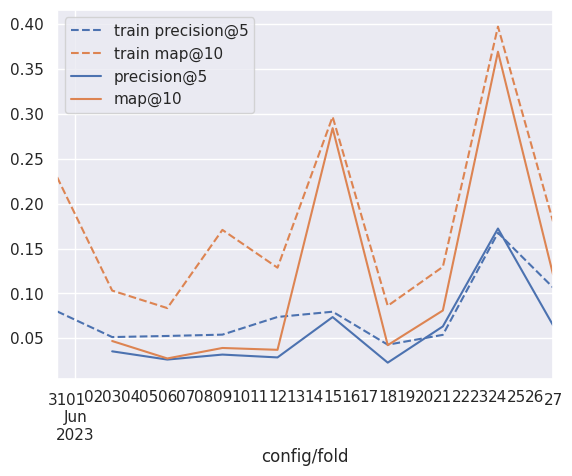

In [44]:
_toplot = best_realistic.copy().sort_index()
_toplot.index = pd.to_datetime(_toplot.index)

ax = best.reset_index().set_index('fold')[cols2plot].rename(columns='train {}'.format).plot(style='--', color=[l.get_color() for l in ax.lines])
# plt.xticks(range(10))
# bdf[cols2plot].rename(columns='baseline {}'.format).reset_index(drop=True).plot(ax=ax, style=':', color=[l.get_color() for l in ax.lines])

_toplot[cols2plot].plot(ax=ax)
# ax.set_ylim(0, 1)

_toplot[cols2plot].describe()

In [45]:
best_realistic.index.min()

Timestamp('2023-06-03 00:00:00')

In [46]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-06-21,0.021368,0.017094,0.017094,0.016239,0.019943,0.022521,0.021368,0.022054,0.025549,0.033361,...,0.048056,0.098297,0.77773,0.323710,0.334830,0.326748,0.308570,0.287767,0.301492,0.402365
2023-06-24,0.361702,0.250000,0.164362,0.086436,0.060461,0.022154,0.361702,0.399934,0.413213,0.415783,...,0.462912,0.473889,1.00000,0.662850,0.912039,0.871463,0.858709,0.859927,0.861670,0.473896
2023-06-27,0.032895,0.070175,0.047368,0.038816,0.035088,0.023553,0.032895,0.092320,0.089688,0.110307,...,0.179195,0.207174,1.00000,0.312381,0.323829,0.331687,0.344544,0.350258,0.360258,0.233954
2023-06-30,0.015748,0.055118,0.037795,0.025984,0.035696,0.019291,0.015748,0.080535,0.086076,0.095149,...,0.149213,0.306037,1.00000,0.666667,0.401852,0.378333,0.359091,0.359091,0.359091,0.205227
2023-07-03,0.083333,0.232639,0.256250,0.216667,0.144444,0.021667,0.083333,0.284229,0.395736,0.564876,...,1.000000,1.000000,1.00000,0.361607,0.360635,0.413280,0.423333,0.423333,0.423333,0.145320
2023-07-06,0.513793,0.402299,0.271034,0.172759,0.115172,0.017276,0.513793,0.677469,0.711316,0.776266,...,1.000000,1.000000,1.00000,0.589933,0.968074,0.899708,0.899708,0.899708,0.899708,0.188610
2023-07-09,0.065574,0.273224,0.367213,0.219672,0.146448,0.021967,0.065574,0.343450,0.555130,0.617423,...,1.000000,1.000000,1.00000,0.562500,0.380808,0.521717,0.521717,0.521717,0.521717,0.137553
2023-07-12,0.019231,0.262821,0.369231,0.219231,0.146154,0.021923,0.019231,0.332979,0.558792,0.612818,...,1.000000,1.000000,1.00000,1.000000,0.377381,0.516667,0.516667,0.516667,0.516667,0.134720
2023-07-15,0.684211,0.456140,0.273684,0.136842,0.091228,0.013684,0.684211,0.883452,0.883452,0.883452,...,1.000000,1.000000,1.00000,0.730769,1.000000,1.000000,1.000000,1.000000,1.000000,0.126128


In [47]:
_PERFECT_NAME = 'Ground Truth'
_LEAK_NAME = 'Leaky GNN'
CAT_ORDER = [_PERFECT_NAME, _LEAK_NAME, 'GNN', 'OpenPop']

def _get_toplot_table(metrics2plot=cols2plot, oracle=True, perfect=None, common_only=False):
    if perfect is None:
        perfect = metrics2plot
    
    # _toplot = best_realistic.copy()
    # _toplot.index = pd.to_numeric(_toplot.index)
    # _toplot['fold'] = _toplot.index

    _first_real_fold_idx = best_realistic.index.min()
    
    _toplot_real = best_realistic[metrics2plot].copy()
    _toplot_real['fold'] = pd.to_datetime(_toplot_real.index) # .astype(int)
    _toplot_real['rec'] = 'GNN'

    _toplot_base = bdf[metrics2plot].copy()
    # fold2str = _toplot_base.index.strftime('%G-W%V')
    # _toplot_base['fold'] = range(len(_toplot_base))
    _toplot_base['fold'] = pd.to_datetime(_toplot_base.index)
    _toplot_base['rec'] = 'OpenPop'

    # _colsbest = map("best_{}".format, _cols)
    if oracle:
        _toplot_best = best.reset_index().set_index('fold')[metrics2plot].copy() # [_colsbest].rename(columns=lambda x: x.split("_", 1)[-1])
        _toplot_best['fold'] = _toplot_best.index
        _toplot_best['rec'] = _LEAK_NAME
    else:
        _toplot_best = None
        _toplot_base = _toplot_base[_toplot_base['fold'] >= _first_real_fold_idx]
        _toplot_real = _toplot_real[_toplot_real['fold'] >= _first_real_fold_idx]

    if perfect:
        _toplot_perfect = pdf[perfect].copy()
        _toplot_perfect['fold'] = pd.to_datetime(_toplot_perfect.index)
        _toplot_perfect['rec'] = _PERFECT_NAME
        # Make same len as baseline
        # _toplot_perfect = _toplot_perfect.iloc[-len(_toplot_base):]
        _toplot_perfect = _toplot_perfect.loc[_toplot_base.index]
        assert _toplot_perfect.index.equals(_toplot_base.index)
    else:
        _toplot_perfect = None
        
    _toplot = (
        pd.concat((
            _toplot_real, 
            _toplot_best,
            _toplot_base,
            _toplot_perfect,
        ), ignore_index=True)
        .melt(id_vars=['fold', 'rec'], value_vars=metrics2plot, var_name='metric')
    )

    assert pd.api.types.is_datetime64_any_dtype(_toplot['fold'].dtype), "Fold column should be datetime"
    assert not (_toplot['fold'].isna()).any()
    
    _toplot['rec'] = pd.Categorical(_toplot['rec'], CAT_ORDER)
    _toplot['fold_week'] = _toplot['fold'].dt.strftime('%G-W%V') # fold2str[_toplot['fold']]

    return _toplot.sort_values('fold')

_tablecols = ['precision@5', 'precision@10', 'recall@5', 'recall@10', 'map@5', 'map@10', 'ndcg@5', 'ndcg@10']
_table = _get_toplot_table(_tablecols)
# Skip the first fold so everyone has 9 folds and metrics are consistent
_table = _table[_table['fold'] >= best_realistic.index.min()]
print(_table.groupby(['rec', 'metric'])['value'].mean().unstack(level=-1)[_tablecols].rename(
    index={
        'Perfect': 'Ground Truth',
        'realistic': 'GNN'
    }
).style.format(precision=2).to_latex())
_table.groupby(['rec', 'metric']).describe()

\begin{tabular}{lrrrrrrrr}
metric & precision@5 & precision@10 & recall@5 & recall@10 & map@5 & map@10 & ndcg@5 & ndcg@10 \\
rec &  &  &  &  &  &  &  &  \\
Ground Truth & 0.35 & 0.19 & 0.89 & 0.90 & 0.90 & 0.90 & 0.90 & 0.90 \\
Leaky GNN & 0.08 & 0.05 & 0.22 & 0.28 & 0.17 & 0.18 & 0.20 & 0.22 \\
GNN & 0.06 & 0.05 & 0.15 & 0.21 & 0.11 & 0.12 & 0.13 & 0.15 \\
OpenPop & 0.18 & 0.11 & 0.49 & 0.58 & 0.31 & 0.34 & 0.37 & 0.41 \\
\end{tabular}



/tmp/ipykernel_3807926/3868849439.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_3807926/3868849439.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



fold                                            \
                          count                 mean                  min   
rec          metric                                                         
Ground Truth map@10          10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             map@5           10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             ndcg@10         10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             ndcg@5          10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             precision@10    10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             precision@5     10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             recall@10       10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             recall@5        10  2023-07-04 12:00:00  2023-06-21 00:00:00   
Leaky GNN    map@10           9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             map@5            9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             ndcg@10          9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             ndcg@5           9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             precision@10     9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             precision@5      9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             recall@10        9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             recall@5         9  2023-06-15 00:00:00  2023-06-03 00:00:00   
GNN          map@10           9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             map@5            9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             ndcg@10          9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             ndcg@5           9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             precision@10     9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             precision@5      9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             recall@10        9  2023-06-15 00:00:00  2023-06-03 00:00:00   
             recall@5         9  2023-06-15 00:00:00  2023-06-03 00:00:00   
OpenPop      map@10          10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             map@5           10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             ndcg@10         10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             ndcg@5          10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             precision@10    10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             precision@5     10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             recall@10       10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             recall@5        10  2023-07-04 12:00:00  2023-06-21 00:00:00   

                                                                     \
                                           25%                  50%   
rec          metric                                                   
Ground Truth map@10        2023-06-27 18:00:00  2023-07-04 12:00:00   
             map@5         2023-06-27 18:00:00  2023-07-04 12:00:00   
             ndcg@10       2023-06-27 18:00:00  2023-07-04 12:00:00   
             ndcg@5        2023-06-27 18:00:00  2023-07-04 12:00:00   
             precision@10  2023-06-27 18:00:00  2023-07-04 12:00:00   
             precision@5   2023-06-27 18:00:00  2023-07-04 12:00:00   
             recall@10     2023-06-27 18:00:00  2023-07-04 12:00:00   
             recall@5      2023-06-27 18:00:00  2023-07-04 12:00:00   
Leaky GNN    map@10        2023-06-09 00:00:00  2023-06-15 00:00:00   
             map@5         2023-06-09 00:00:00  2023-06-15 00:00:00   
             ndcg@10       2023-06-09 00:00:00  2023-06-15 00:00:00   
             ndcg@5        2023-06-09 00:00:00  2023-06-15 00:00:00   
             precision@10  2023-06-09 00:00:00  2023-06-15 00:00:00   
             precision@5   2023-06-09 00:00:00  2023-06-15 00:00:00   
             recall@10     2023-06-09 00:00:00  2023-06-15 00:00:00   
             recall@5      2023-06-09 00:00:00  2023-

/tmp/ipykernel_3807926/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3807926/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



count      mean       std       min       25%  \
rec          metric                                                       
Ground Truth map@10        10.0  0.900000  0.316228  0.000000  1.000000   
             precision@5   10.0  0.354262  0.135501  0.000000  0.353503   
Leaky GNN    map@10        10.0  0.180615  0.101435  0.083656  0.109551   
             precision@5   10.0  0.076229  0.037379  0.042857  0.052908   
GNN          map@10         9.0  0.116537  0.124441  0.027529  0.039204   
             precision@5    9.0  0.057654  0.047007  0.022857  0.028689   
OpenPop      map@10        10.0  0.341082  0.295488  0.000000  0.065852   
             precision@5   10.0  0.180403  0.145575  0.000000  0.040189   

                               50%       75%       max  
rec          metric                                     
Ground Truth map@10       1.000000  1.000000  1.000000  
             precision@5  0.393351  0.435617  0.452991  
Leaky GNN    map@10       0.150233  0.217284  0.397329  
             precision@5  0.063922  0.079910  0.167553  
GNN          map@10       0.046961  0.121055  0.369402  
             precision@5  0.035474  0.064474  0.172340  
OpenPop      map@10       0.392497  0.469215  0.842105  
             precision@5  0.210306  0.273022  0.369231

Cannot show ipywidgets in text

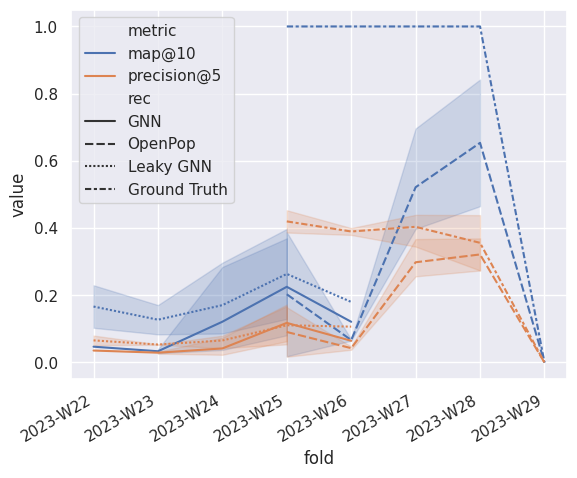

In [48]:
def plot_gnn_results(metrics2plot=cols2plot, oracle=False, perfect=None, common_only=False):
    _toplot = _get_toplot_table(metrics2plot, oracle, perfect)

    if common_only:
        _toplot = _toplot[_toplot['fold'] >= best_realistic.index.min()]

    ax = sns.lineplot(
        _toplot, x='fold_week', y='value', 
        hue='metric' if len(metrics2plot) > 1 else None, 
        style='rec',
        style_order=['GNN', 'OpenPop', _LEAK_NAME, _PERFECT_NAME],
    )
    ax.set_xlabel('fold')
    
    if len(metrics2plot) == 1:
        ax.set_ylabel(metrics2plot[0])
        ax.legend_.set_title(None)

    # ax.set_xticks(ax.get_xticks()[1:-1], _toplot_base.index.strftime('%G-W%V'), rotation=30, ha='right')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

    display(_toplot.groupby(['rec', 'metric'])['value'].describe())
    # print(_toplot.groupby(['rec', 'metric'])['value'].describe()[['mean', 'std', '50%', 'min', 'max']].to_html())

    return ax

ax = plot_gnn_results(oracle=True) # perfect=['precision@5'])
download_matplotlib(ax.figure, '09_gnn_results.pdf')

/tmp/ipykernel_3807926/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3807926/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.354262,0.135501,0.000000,0.353503,0.393351,0.435617,0.452991
GNN,precision@5,9.0,0.057654,0.047007,0.022857,0.028689,0.035474,0.064474,0.172340
OpenPop,precision@5,10.0,0.180403,0.145575,0.000000,0.040189,0.210306,0.273022,0.369231


Cannot show ipywidgets in text

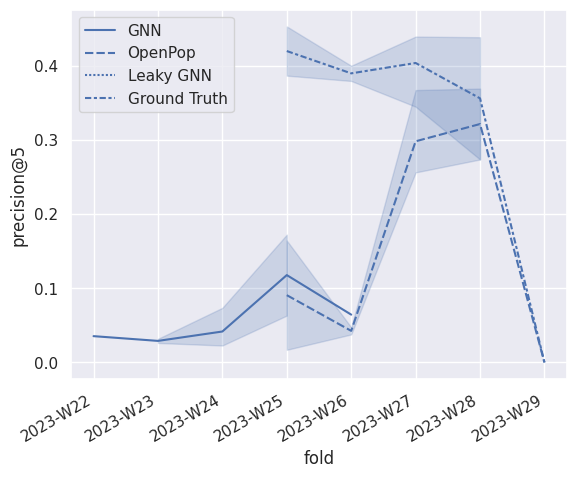

In [49]:
ax = plot_gnn_results(['precision@5'])
ax.figure.savefig('../figures/09_gnn_results_precision_5.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_precision_5.pdf')

/tmp/ipykernel_3807926/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3807926/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.354262,0.135501,0.000000,0.353503,0.393351,0.435617,0.452991
Leaky GNN,precision@5,9.0,0.075810,0.039622,0.042857,0.052595,0.054074,0.079641,0.167553
GNN,precision@5,9.0,0.057654,0.047007,0.022857,0.028689,0.035474,0.064474,0.172340
OpenPop,precision@5,10.0,0.180403,0.145575,0.000000,0.040189,0.210306,0.273022,0.369231


Cannot show ipywidgets in text

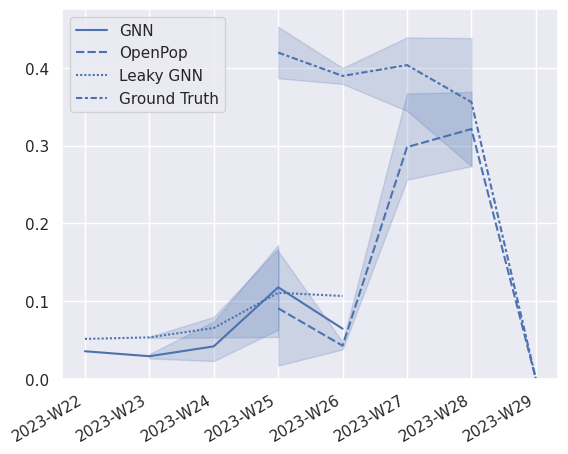

In [50]:
ax = plot_gnn_results(['precision@5'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_precision_5_leaky.pdf')

/tmp/ipykernel_3807926/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3807926/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,map@10,10.0,0.900000,0.316228,0.000000,1.000000,1.000000,1.000000,1.000000
GNN,map@10,9.0,0.116537,0.124441,0.027529,0.039204,0.046961,0.121055,0.369402
OpenPop,map@10,10.0,0.341082,0.295488,0.000000,0.065852,0.392497,0.469215,0.842105


Cannot show ipywidgets in text

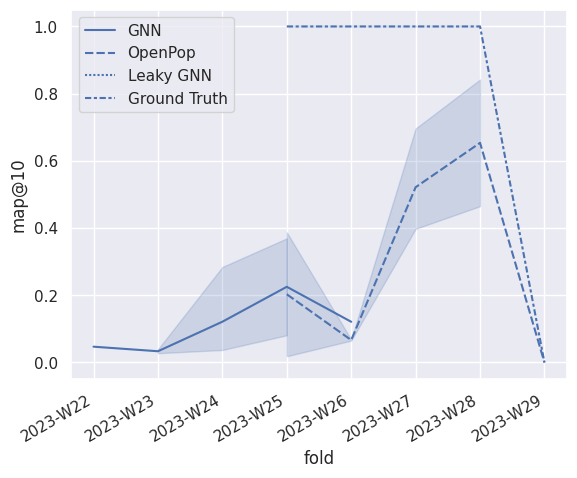

In [51]:
ax = plot_gnn_results(['map@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_map_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_map_10.pdf')

/tmp/ipykernel_3807926/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3807926/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.900000,0.316228,0.000000,1.000000,1.000000,1.000000,1.000000
GNN,ndcg@10,9.0,0.151974,0.128908,0.051418,0.065834,0.081473,0.178808,0.414041
OpenPop,ndcg@10,10.0,0.410944,0.327513,0.000000,0.098939,0.490329,0.616272,0.883452


Cannot show ipywidgets in text

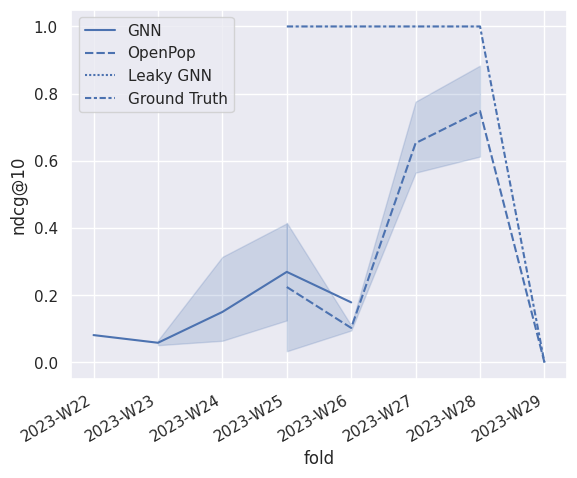

In [52]:
ax = plot_gnn_results(['ndcg@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_ndcg_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_ndcg_10.pdf')

/tmp/ipykernel_3807926/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3807926/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.900000,0.316228,0.000000,1.000000,1.000000,1.000000,1.000000
Leaky GNN,ndcg@10,9.0,0.215180,0.106522,0.116369,0.133084,0.180931,0.260672,0.441048
GNN,ndcg@10,9.0,0.151974,0.128908,0.051418,0.065834,0.081473,0.178808,0.414041
OpenPop,ndcg@10,10.0,0.410944,0.327513,0.000000,0.098939,0.490329,0.616272,0.883452


Cannot show ipywidgets in text

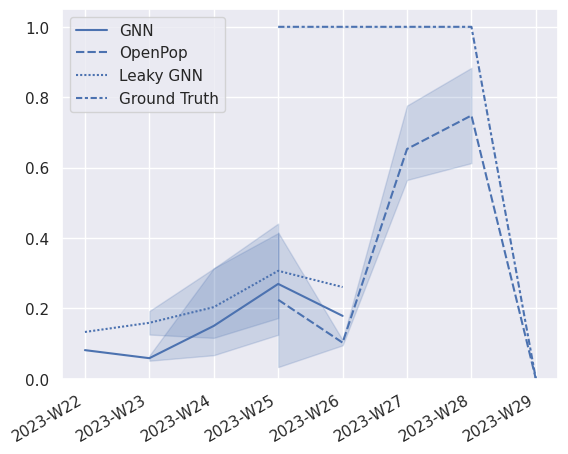

In [53]:
ax = plot_gnn_results(['ndcg@10'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_ndcg_10_leaky.pdf')